In [2]:
import openslide
import geopandas as gpd
import json
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, MultiPolygon
from PIL import Image
from large_image import getTileSource
import tifffile
import numpy as np
import geopandas as gpd
import os
from shapely.affinity import translate


In [ ]:
annotations = gpd.read_file("../../data/raw/slide-2024-04-03T07-52-35-R1-S2.geojson")
annotations.head()

,id,objectType,classification,geometry
0,e61be433-ec8b-40a6-be77-0684c3574b00,annotation,"{ ""name"": ""veľké nepravidelné jadro"", ""color"":...","POLYGON ((39193 56511, 39192.93 56514.01, 3919..."
1,e026938c-82e1-4acf-b4e8-13701d8b69c8,annotation,"{ ""name"": ""veľké jadro"", ""color"": [ 194, 93, 1...","POLYGON ((39130 56507, 39129.96 56509.01, 3912..."
2,f3c3eacf-2bec-4332-af05-acffbfa57ce6,annotation,"{ ""name"": ""nepravidelné jadro"", ""color"": [ 163...","POLYGON ((39224 56564.5, 39223.92 56566.85, 39..."
3,0c7a9429-5529-4f95-a490-9becb65c2efb,annotation,"{ ""name"": ""nepravidelné jadro"", ""color"": [ 163...","POLYGON ((39240 56621, 39239.96 56624.01, 3923..."
4,22efcfd4-dd9c-4c77-88b9-7dba1539ce33,annotation,"{ ""name"": ""nepravidelné jadro"", ""color"": [ 163...","POLYGON ((39287 56649, 39286.93 56651.13, 3928..."


In [37]:
annotations.classification

0      {'name': 'veľké nepravidelné jadro', 'color': ...
1        {'name': 'veľké jadro', 'color': [194, 93, 19]}
2      {'name': 'nepravidelné jadro', 'color': [163, ...
3      {'name': 'nepravidelné jadro', 'color': [163, ...
4      {'name': 'nepravidelné jadro', 'color': [163, ...
                             ...                        
381    {'name': 'nepravidelné jadro', 'color': [163, ...
382    {'name': 'nepravidelné jadro', 'color': [163, ...
383    {'name': 'nepravidelné jadro', 'color': [163, ...
384    {'name': 'nepravidelné jadro', 'color': [163, ...
385    {'name': 'nepravidelné jadro', 'color': [163, ...
Name: classification, Length: 386, dtype: object

In [5]:
# loaded as strings -> converted to dicts
annotations["classification"] = annotations["classification"].apply(json.loads)

In [ ]:
# load the WSI
wsi_path = "../../data/raw/slide-2024-04-03T07-52-35-R1-S2.mrxs"
source = getTileSource(wsi_path)

metadata = source.getMetadata()
mpp_x = float(metadata.get("mm_x", 0)) * 1000  # convert mm to microns
mpp_y = float(metadata.get("mm_y", 0)) * 1000

print(f"WSI Resolution: {mpp_x} × {mpp_y} microns per pixel")

WSI Resolution: 0.274358240290104 × 0.274358240290104 microns per pixel


In [39]:
# def plot_annotation(annotation):
#     roi_polygon = annotation.geometry
#     minx, miny, maxx, maxy = roi_polygon.bounds

#     margin = 100
#     x0, y0 = int(minx - margin), int(miny - margin)
#     x1, y1 = int(maxx + margin), int(maxy + margin)
#     width, height = x1 - x0, y1 - y0

#     region = {
#         'left': int(x0),
#         'top': int(y0),
#         'width': int(width),
#         'height': int(height),
#         'units': 'base_pixels'
#     }

#     print(f"Extracting region: {region}")

#     tile_image, _ = source.getRegion(region=region, format='PIL')

#     tile_rgb = np.array(tile_image.convert("RGB"))

#     fig, ax = plt.subplots(figsize=(5, 5))

#     ax.imshow(tile_rgb, extent=[x0, x1, y1, y0])

#     x, y = roi_polygon.exterior.xy
#     ax.plot(x, y, color='red', linewidth=2)
#     ax.set_title(annotation.classification["name"])
def plot_annotation(annotation, ax=None):
    roi_polygon = annotation.geometry
    minx, miny, maxx, maxy = roi_polygon.bounds

    margin = 100
    x0, y0 = int(minx - margin), int(miny - margin)
    x1, y1 = int(maxx + margin), int(maxy + margin)
    width, height = x1 - x0, y1 - y0

    region = {
        'left': int(x0),
        'top': int(y0),
        'width': int(width),
        'height': int(height),
        'units': 'base_pixels'
    }

    tile_image, _ = source.getRegion(region=region, format='PIL')
    tile_rgb = np.array(tile_image.convert("RGB"))

    # If ax not provided, create a new figure/axes
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))

    ax.imshow(tile_rgb, extent=[x0, x1, y1, y0])

    x, y = roi_polygon.exterior.xy
    ax.plot(x, y, color='red', linewidth=2)
    ax.set_title(annotation.classification["name"])
    ax.axis("off")


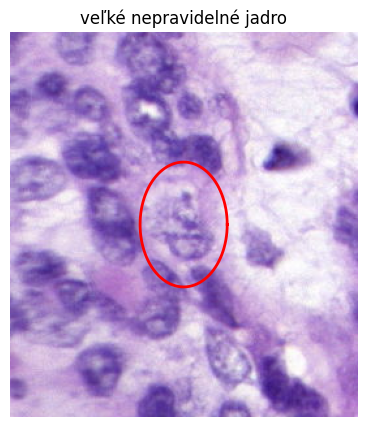

In [40]:
plot_annotation(annotations.iloc[0])

# Group by class & plot

In [41]:
annotations["class_name"] = annotations["classification"].apply(lambda cls: cls["name"])
# for class_name, group in annotations.groupby("class_name"):
#     # Pick first two examples from this group
#     examples = group.head(2)

#     print(f"=== {class_name} ({len(group)} total) ===")
#     for _, annotation in examples.iterrows():
#         plot_annotation(annotation)

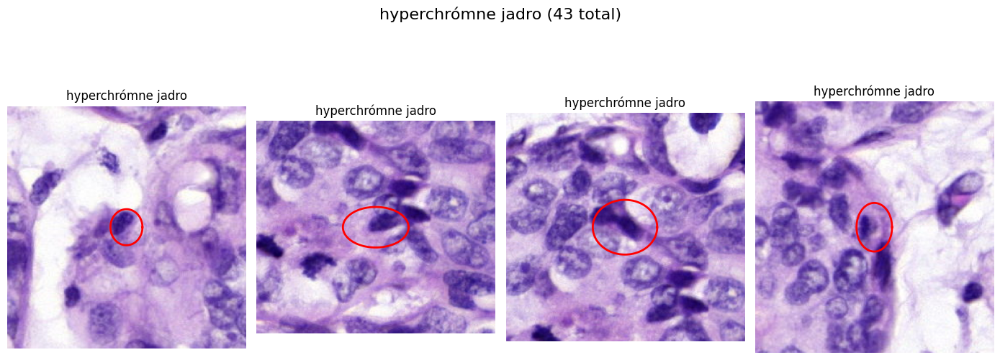

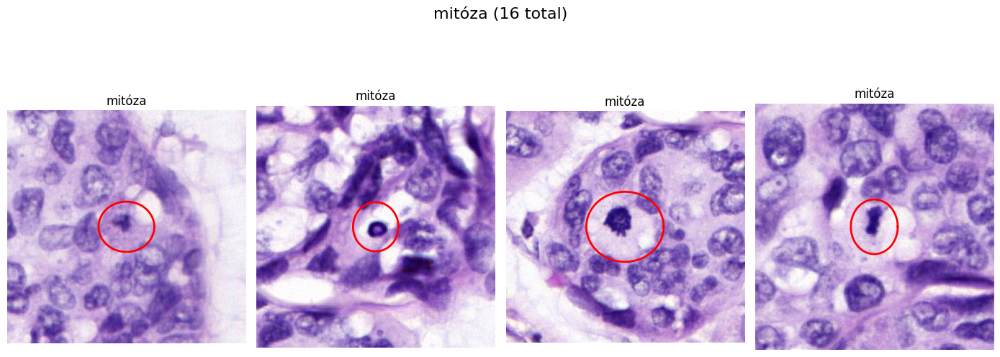

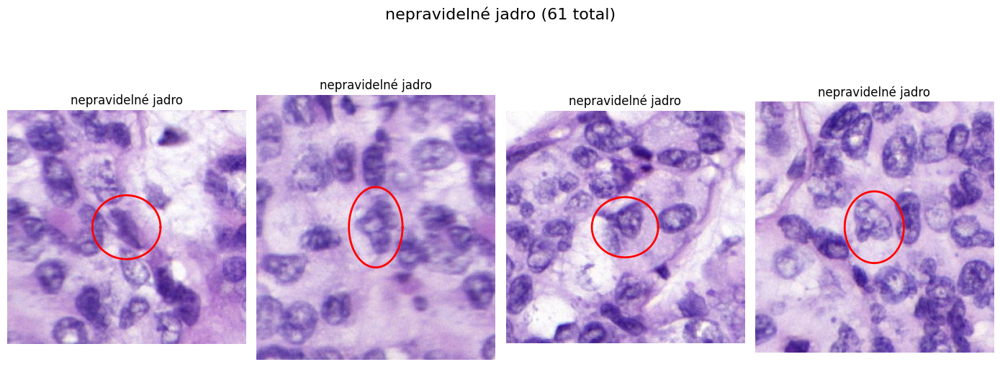

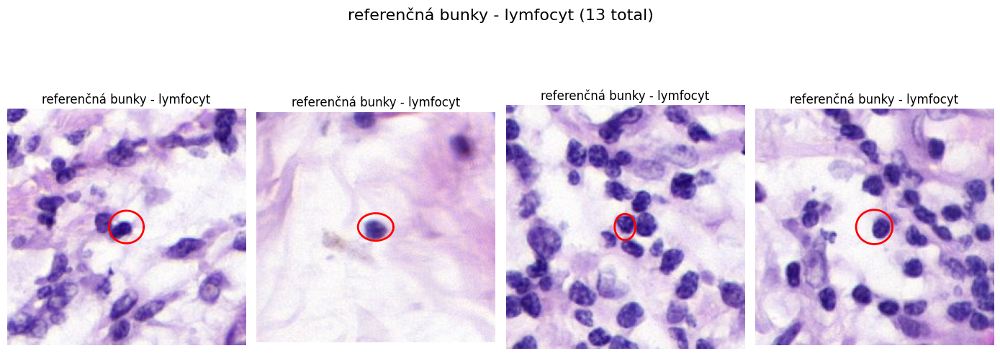

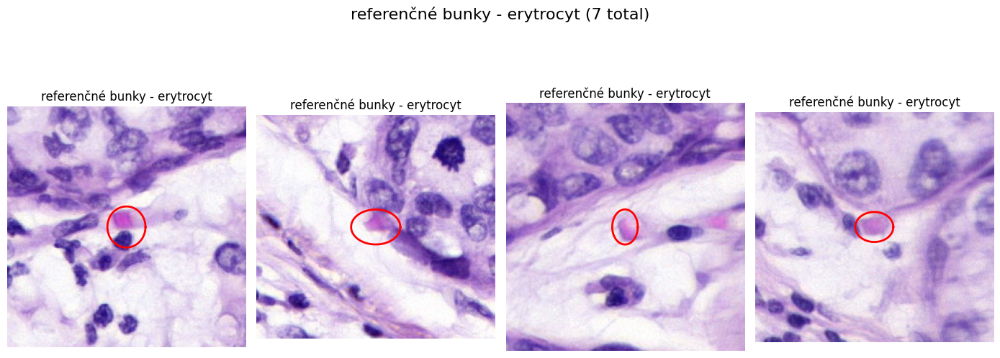

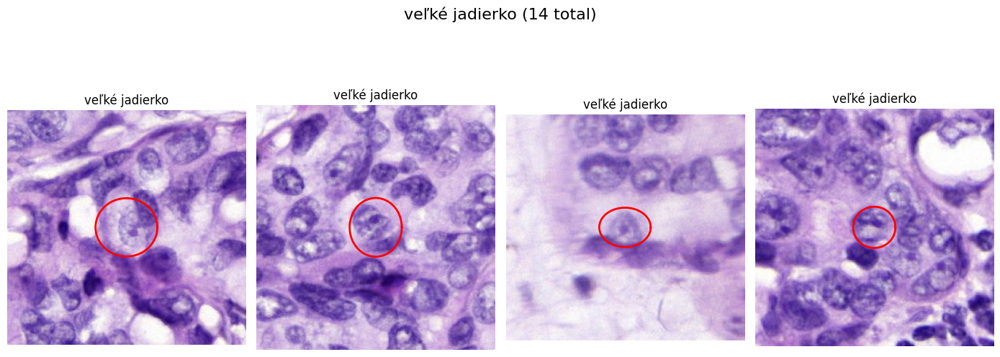

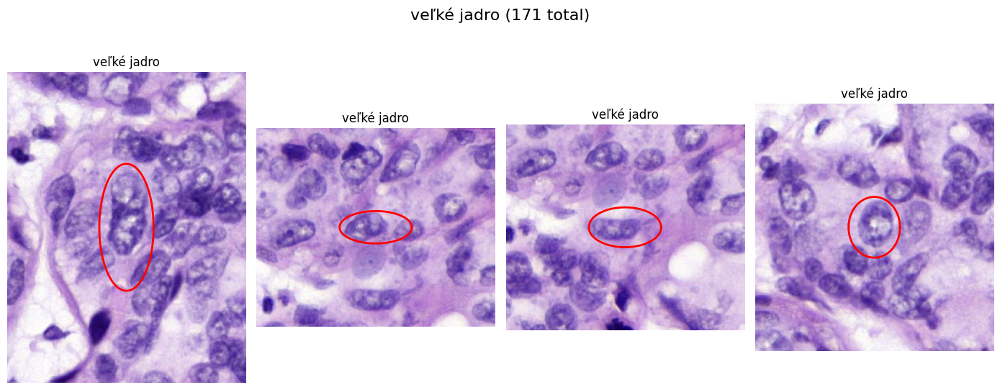

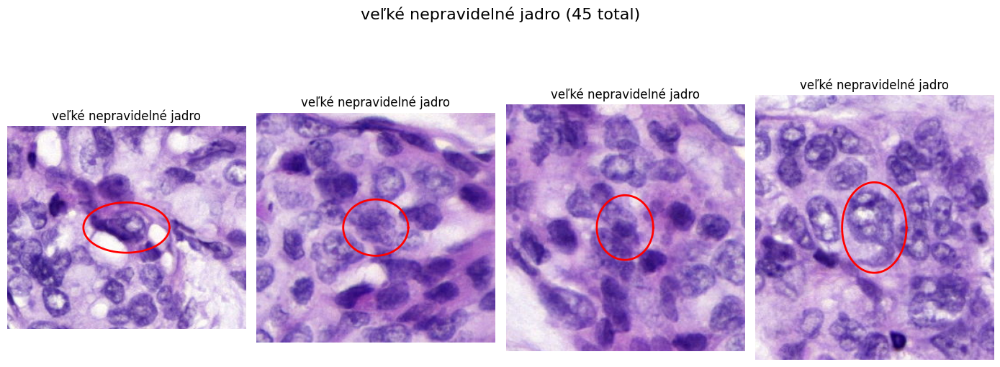

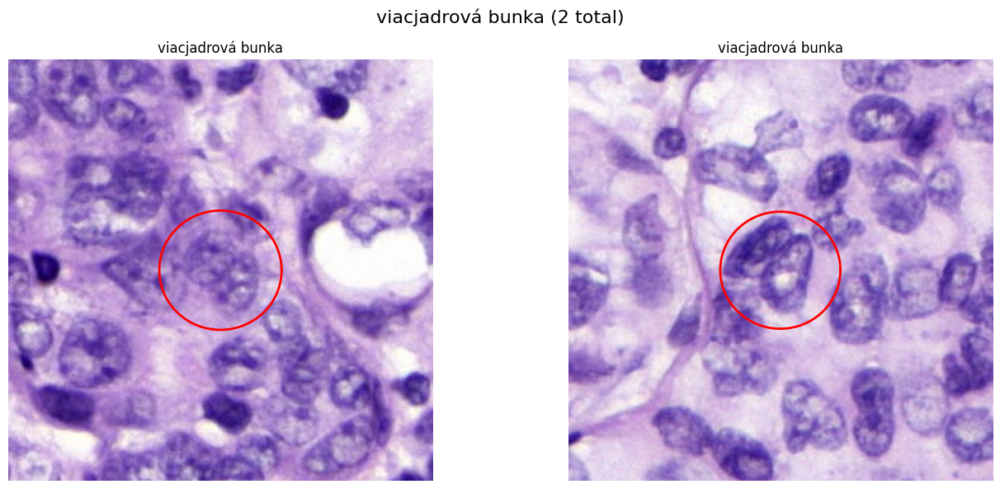

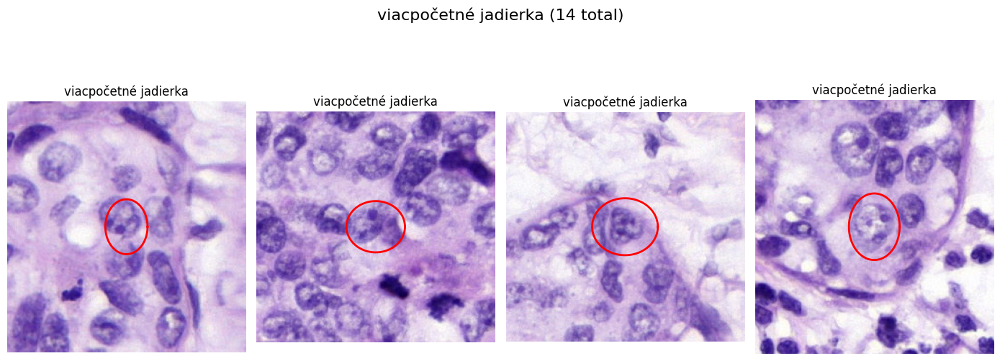

In [ ]:
EXAMPLES_PER_PLOT=4

for class_name, group in annotations.groupby("class_name"):
    examples = group.sample(n=min(EXAMPLES_PER_PLOT, len(group)), random_state=42)

    fig, axes = plt.subplots(1, len(examples), figsize=(14, 6))
    if len(examples) == 1:
        axes = [axes]  # make iterable if only one example

    for ax, (_, annotation) in zip(axes, examples.iterrows()):
        plot_annotation(annotation, ax=ax)

    fig.suptitle(f"{class_name} ({len(group)} total)", fontsize=16)
    plt.tight_layout()
    plt.show()
